In [4]:
# 필요 라이브러리 로드
from matplotlib import font_manager, rc
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import platform
from autogluon.tabular import TabularDataset, TabularPredictor
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
if platform.system() == 'Windows':
# 윈도우인 경우 맑은 고딕 폰트 이용
    font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf"
                                           ).get_name()
    rc('font', family=font_name)
else:    
# Mac 인 경우
    rc('font', family='AppleGothic')

#그래프에서 마이너스 기호가 표시되게 하는 설정입니다.
plt.rcParams['axes.unicode_minus'] == False

False

In [34]:
from sklearn.model_selection import train_test_split

In [5]:
path = 'processing_data/시간별_전력데이터.csv'
# blackout_df = pd.read_excel(path1)
df = pd.read_csv(path, encoding='cp949')

In [ ]:
# # combine year, month, day, and time columns into a single string column
# date_str = df['year'].astype(str) + '-' + df['month'].astype(str).str.zfill(2) + '-' + df['day'].astype(str).str.zfill(2) + ' ' + df['hour'].astype(str).str.zfill(2)+'0000'
# date_str
# # convert the string column to datetime format
# df['datetime'] = pd.to_datetime(date_str, format='%Y-%m-%d %H%M%S')

In [6]:
df

,Unnamed: 0,공급능력(MW),현재수요(MW),공급예비력(MW),공급예비율(퍼센트),datetime
0,0,64355.000000,50990.289167,13364.711667,26.224017,2012-06-01 00:00:00
1,1,64355.000000,50064.355000,14290.646667,28.545997,2012-06-01 01:00:00
2,2,64559.166667,49986.542500,14572.623333,29.156328,2012-06-01 02:00:00
3,3,64845.000000,50093.080833,14751.918333,29.453125,2012-06-01 03:00:00
4,4,64845.000000,50456.725833,14388.274167,28.518804,2012-06-01 04:00:00
...,...,...,...,...,...,...
86333,86333,83646.116667,69966.391667,13679.708333,19.555125,2022-04-07 19:00:00
86334,86334,83715.825000,68310.458333,15405.366667,22.558508,2022-04-07 20:00:00
86335,86335,83529.483333,66472.925000,17056.575000,25.663192,2022-04-07 21:00:00
86336,86336,83061.116667,65215.066667,17846.050000,27.372808,2022-04-07 22:00:00


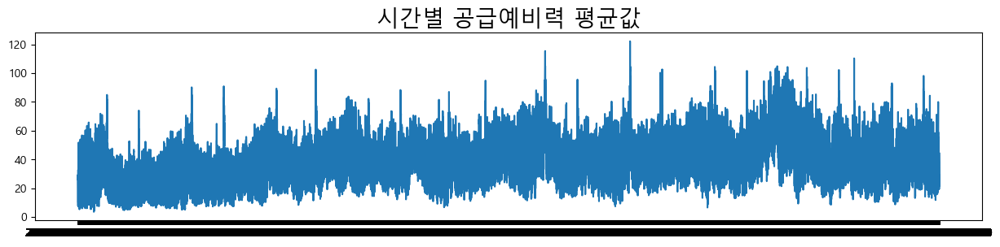

In [8]:
plt.figure(figsize=(15,3)) # 그래프 크기 조정
plt.plot(df['datetime'],df['공급예비율(퍼센트)'])
plt.title('시간별 공급예비력 평균값', size = 20)
# 공급예비율  = 총 공급전력량에서 최대 전력수요를 뺀 것을 최대 전력수요로 나누어 산출한 수치
plt.show()

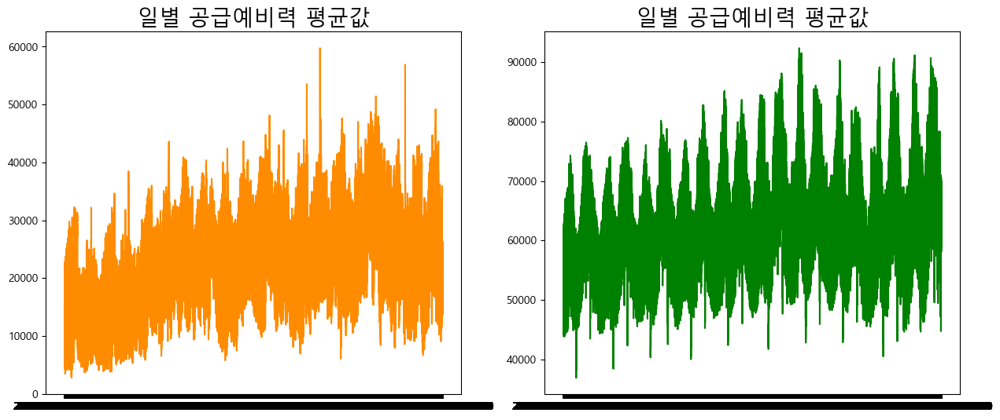

In [9]:
plt.figure(figsize=(15,6)) # 그래프 크기 조정
plt.subplot(1,2,1)
plt.plot(df['datetime'],df['공급예비력(MW)'],'darkorange')
plt.title('일별 공급예비력 평균값', size = 20)
plt.subplot(1,2,2)
plt.plot(df['datetime'],df['현재수요(MW)'],'green')
plt.title('일별 공급예비력 평균값', size = 20)
# 공급예비율  = 총 공급전력량에서 최대 전력수요를 뺀 것을 최대 전력수요로 나누어 산출한 수치
plt.show()

In [16]:
df_p = df[['datetime','현재수요(MW)']]
df_p.rename(columns={'datetime':'ds','현재수요(MW)':'y'},inplace= True)
df_p

C:\Users\ban05\AppData\Local\Temp\ipykernel_17416\2956277833.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p.rename(columns={'datetime':'ds','현재수요(MW)':'y'},inplace= True)


,ds,y
0,2012-06-01 00:00:00,50990.289167
1,2012-06-01 01:00:00,50064.355000
2,2012-06-01 02:00:00,49986.542500
3,2012-06-01 03:00:00,50093.080833
4,2012-06-01 04:00:00,50456.725833
...,...,...
86333,2022-04-07 19:00:00,69966.391667
86334,2022-04-07 20:00:00,68310.458333
86335,2022-04-07 21:00:00,66472.925000
86336,2022-04-07 22:00:00,65215.066667


In [21]:
train_df = df_p.head(-365)

m = Prophet(seasonality_mode='additive')
m.fit(train_df)

INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [22]:
future_df = df_p.copy()
# future_df.rename(columns={'date':'ds'},inplace=True)
forecast = m.predict(future_df)

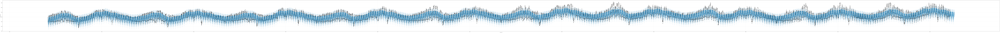

In [30]:
fig1 = m.plot(forecast, figsize=(300,10), xlabel='year-month', ylabel='reward amount')

c:\Users\ban05\anaconda3\envs\machine_learning\lib\site-packages\prophet\plot.py:194: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.tight_layout()
c:\Users\ban05\anaconda3\envs\machine_learning\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
c:\Users\ban05\anaconda3\envs\machine_learning\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


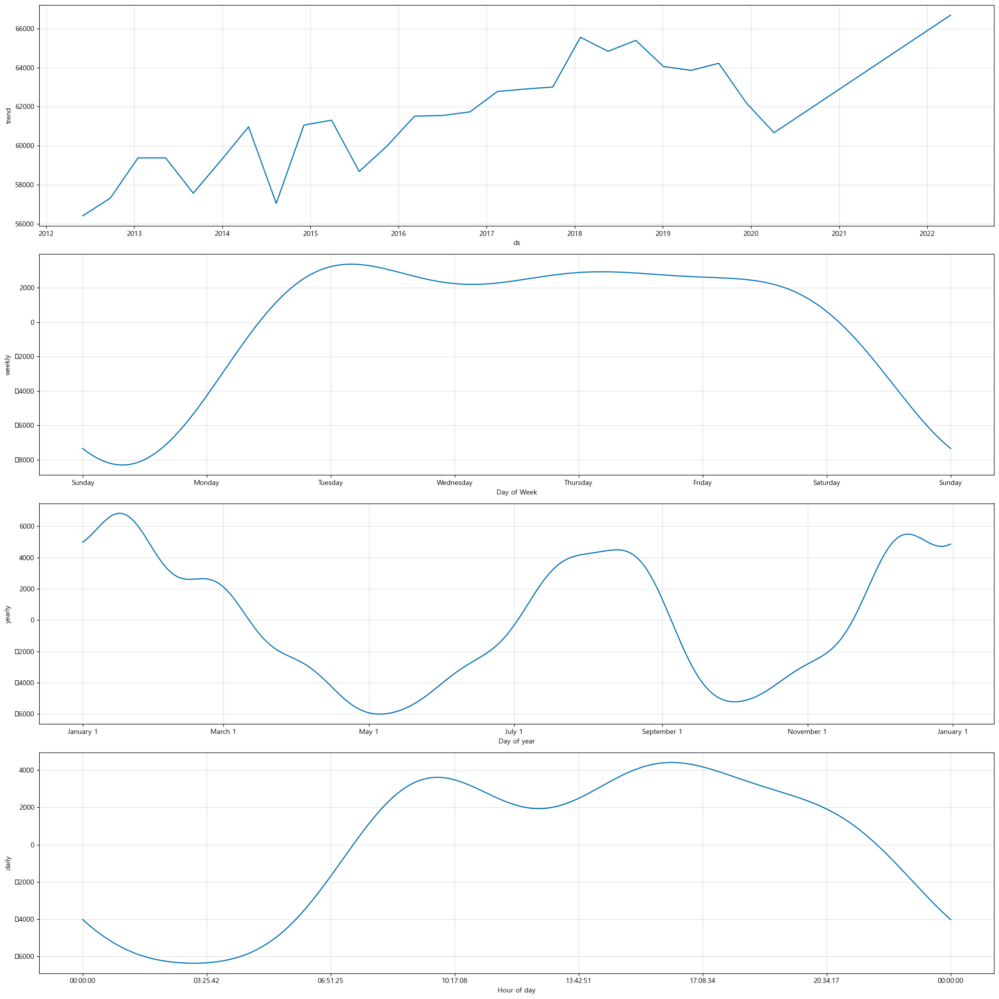

In [24]:
fig2 = m.plot_components(forecast, figsize=(20,20))

In [41]:
df.drop(labels = 'Unnamed: 0',axis=1, inplace = True)

In [42]:
df.head(2)

,공급능력(MW),현재수요(MW),공급예비력(MW),공급예비율(퍼센트),datetime
0,64355.0,50990.289167,13364.711667,26.224017,2012-06-01 00:00:00
1,64355.0,50064.355000,14290.646667,28.545997,2012-06-01 01:00:00


머신러닝을 사용하여 예측하기 단 다른 데이터도 넣어서 예측

In [77]:
from autogluon.tabular import TabularPredictor
 
train, test =  train_test_split(df, train_size = 0.7,shuffle=False)

In [83]:
predictor = TabularPredictor(label='현재수요(MW)').fit(train)

No path specified. Models will be saved in: "AutogluonModels\ag-20230326_104947\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20230326_104947\"
AutoGluon Version:  0.7.0
Python Version:     3.8.16
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.22621
Train Data Rows:    60436
Train Data Columns: 4
Label Column: 현재수요(MW)
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (92375.44166666668, 36883.21083333333, 61234.86488, 8031.84111)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    2657.05 M

[1000]	valid_set's rmse: 279.261
[2000]	valid_set's rmse: 239.088
[3000]	valid_set's rmse: 219.216
[4000]	valid_set's rmse: 205.463
[5000]	valid_set's rmse: 195.665
[6000]	valid_set's rmse: 188.029
[7000]	valid_set's rmse: 182.351
[8000]	valid_set's rmse: 177.451
[9000]	valid_set's rmse: 173.406
[10000]	valid_set's rmse: 169.65


	-169.6505	 = Validation score   (-root_mean_squared_error)
	8.81s	 = Training   runtime
	0.46s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 128.879
[2000]	valid_set's rmse: 105.887
[3000]	valid_set's rmse: 97.9365
[4000]	valid_set's rmse: 94.0698
[5000]	valid_set's rmse: 91.7414
[6000]	valid_set's rmse: 90.2776
[7000]	valid_set's rmse: 89.412
[8000]	valid_set's rmse: 88.6477
[9000]	valid_set's rmse: 88.1022
[10000]	valid_set's rmse: 87.6097


	-87.6093	 = Validation score   (-root_mean_squared_error)
	6.7s	 = Training   runtime
	0.38s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-129.5727	 = Validation score   (-root_mean_squared_error)
	7.09s	 = Training   runtime
	0.04s	 = Validation runtime
Fitting model: CatBoost ...
	-79.6257	 = Validation score   (-root_mean_squared_error)
	131.63s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: ExtraTreesMSE ...
	-98.6373	 = Validation score   (-root_mean_squared_error)
	2.4s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-90.8691	 = Validation score   (-root_mean_squared_error)
	48.97s	 = Training   runtime
	0.02s	 = Validation runtime
Fitting model: XGBoost ...
	-92.557	 = Validation score   (-root_mean_squared_error)
	14.48s	 = Training   runtime
	0.41s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-389.1597	 = Validation score   (-root_mean_squared_error)
	30.95s	 = Training   runtime
	0.02s	 = Vali

[1000]	valid_set's rmse: 104.491
[2000]	valid_set's rmse: 97.0082
[3000]	valid_set's rmse: 94.5367
[4000]	valid_set's rmse: 93.5982
[5000]	valid_set's rmse: 93.0952
[6000]	valid_set's rmse: 92.9824
[7000]	valid_set's rmse: 93.1035


	-92.9705	 = Validation score   (-root_mean_squared_error)
	11.67s	 = Training   runtime
	0.34s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	-52.1956	 = Validation score   (-root_mean_squared_error)
	0.24s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 303.66s ... Best model: "WeightedEnsemble_L2"
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("AutogluonModels\ag-20230326_104947\")


In [101]:
# Generate predictions on test dataset
# WeightedEnsemble_L2의 모델로 측정 떄떄로 모델이 달라짐 
test_preds = predictor.predict(test)

In [95]:
test.reset_index(inplace=True)

In [97]:
test_x = test.set_index('datetime')

In [103]:
test_preds

0        58539.210938
1        61399.824219
2        65527.367188
3        66568.992188
4        66214.976562
             ...     
25897    69937.742188
25898    68234.156250
25899    66418.312500
25900    65162.929688
25901    64090.980469
Name: 현재수요(MW), Length: 25902, dtype: float32

In [108]:
test_pred = pd.concat ([test_preds,test['datetime']],axis =1)


In [110]:
test_pred = test_pred.set_index('datetime')

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


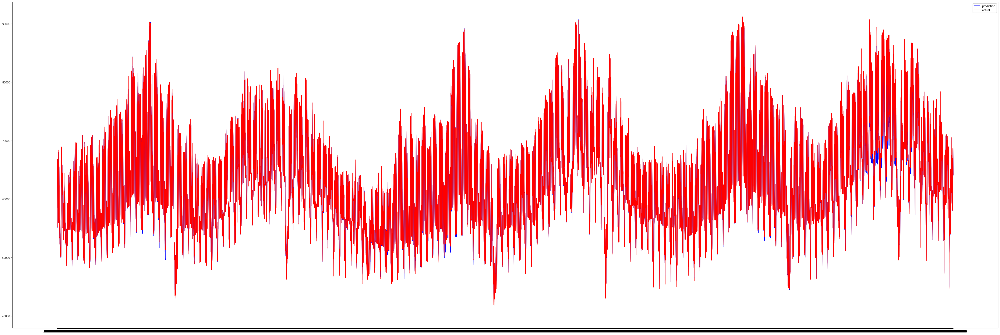

In [116]:

# Create a figure and axes object
fig, ax = plt.subplots(figsize=(60,20))

# Plot the first value as a blue line /Value 1
ax.plot(test_pred, color='blue', label='prediction')

# Plot the second value as a red line /Value 2
ax.plot(test_x['현재수요(MW)'], color='red', label='actual')

# Add a legend
ax.legend()

# Show the plot
plt.show()


In [56]:
# 각각의 모델의 훈련 성능을 평가할 수 있음
ld_board = predictor.leaderboard(test, silent=True)
ld_board

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-49.715068,-33.986326,5.166596,0.483029,220.962692,0.014281,0.008676,0.247303,2,True,12
1,ExtraTreesMSE,-61.959906,-49.973784,0.515850,0.050501,2.995872,0.515850,0.050501,2.995872,1,True,7
2,NeuralNetFastAI,-69.993424,-58.833405,0.308117,0.026356,46.176194,0.308117,0.026356,46.176194,1,True,8
3,RandomForestMSE,-74.924712,-65.498103,0.511450,0.051195,9.906483,0.511450,0.051195,9.906483,1,True,5
4,CatBoost,-89.230922,-83.181468,0.063668,0.007304,124.822619,0.063668,0.007304,124.822619,1,True,6
5,LightGBM,-98.584533,-92.785833,3.664484,0.329995,5.718753,3.664484,0.329995,5.718753,1,True,4
6,XGBoost,-102.690395,-97.660294,5.899987,0.501576,13.934747,5.899987,0.501576,13.934747,1,True,9
7,LightGBMLarge,-104.012788,-100.851712,3.341788,0.301178,12.838682,3.341788,0.301178,12.838682,1,True,11
8,LightGBMXT,-167.021747,-164.167628,5.352664,0.442333,8.226538,5.352664,0.442333,8.226538,1,True,3
9,NeuralNetTorch,-474.376195,-476.664285,0.088747,0.009003,31.095467,0.088747,0.009003,31.095467,1,True,10


In [ ]:
ld_board = predictor.leaderboard(test, silent=True)
ld_board